In [1]:
# # Install required packages
# !pip install datasets transformers torch accelerate librosa soundfile jiwer
# !pip install nltk textblob vaderSentiment scikit-learn wordcloud matplotlib
# !pip install seaborn pandas plotly

In [2]:
# Import all required libraries
import os
import re
import nltk
import torch
import librosa
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import soundfile as sf
from IPython.display import Audio, display

# Hugging Face and Speech Recognition
from datasets import load_dataset
from transformers import WhisperForConditionalGeneration, WhisperProcessor

# NLP and Text Processing
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.probability import FreqDist
from textblob import TextBlob
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer
from sklearn.feature_extraction.text import TfidfVectorizer
from wordcloud import WordCloud

# Evaluation Metrics
from jiwer import wer, cer

# Download NLTK data
nltk.download('punkt', quiet=True)
nltk.download('stopwords', quiet=True)
nltk.download('vader_lexicon', quiet=True)

print("All libraries imported successfully!")

c:\Users\Lunatic\AppData\Local\Programs\Python\Python313\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


All libraries imported successfully!


In [3]:
# 1. Dataset Access & Setup
print("Setting up a stream to the dataset...")
dataset = load_dataset("tobiolatunji/afrispeech-200", "all", split="train", streaming=True)
print("Dataset stream is ready!")

print("Loading 20 samples from the stream...")
samples = []
for i, sample in enumerate(dataset):
    samples.append(sample)
    if i >= 19:
        break
print(f"Successfully loaded {len(samples)} samples!")

df_data = []
for i, sample in enumerate(samples):
    audio_array = np.array(sample['audio']['array'], dtype=np.float32)
    duration = len(audio_array) / sample['audio']['sampling_rate']
    
    df_data.append({
        'sample_id': i,
        'speaker_id': sample.get('speaker_id', 'N/A'),
        'country': sample.get('country', 'N/A'),
        'accent': sample.get('accent', 'N/A'),
        'gender': sample.get('gender', 'N/A'),
        'age_group': sample.get('age_group', 'N/A'),
        'domain': sample.get('domain', 'N/A'),
        'duration (sec)': duration,
        'transcript': sample.get('transcript', ''),
        'audio_array': audio_array,
        'sampling_rate': sample['audio']['sampling_rate']
    })

df = pd.DataFrame(df_data)

print("\n" + "="*50)
print("DATASET STATISTICS")
print("="*50)
print(f"Total samples: {len(df)}")
print(f"Countries represented: {df['country'].nunique()} → {list(df['country'].unique())}")

Setting up a stream to the dataset...


c:\Users\Lunatic\AppData\Local\Programs\Python\Python313\Lib\site-packages\datasets\load.py:1461: FutureWarning: The repository for tobiolatunji/afrispeech-200 contains custom code which must be executed to correctly load the dataset. You can inspect the repository content at https://hf.co/datasets/tobiolatunji/afrispeech-200
You can avoid this message in future by passing the argument `trust_remote_code=True`.
Passing `trust_remote_code=True` will be mandatory to load this dataset from the next major release of `datasets`.
  warnings.warn(


Dataset stream is ready!
Loading 20 samples from the stream...


Reading metadata...: 57819it [00:31, 1857.61it/s]


Successfully loaded 20 samples!

DATASET STATISTICS
Total samples: 20
Countries represented: 2 → ['BW', 'ZA']


In [4]:
def save_and_play_audio(audio_array, sampling_rate, filename):
    if not os.path.exists('audio_samples'):
        os.makedirs('audio_samples')
    
    filepath = os.path.join('audio_samples', filename)
    sf.write(filepath, audio_array, sampling_rate, format='wav')
    return Audio(filepath)

print("Saving and displaying the first 5 audio samples...")
for i in range(min(5, len(df))):
    sample = df.iloc[i]
    filename = f"sample_{i+1}_{sample['country']}_{sample['accent']}.wav"
    
    print(f"\nSample {i+1}:")
    print(f"  Transcript: {sample['transcript'][:100]}...")
    
    audio_player = save_and_play_audio(
        sample['audio_array'],
        sample['sampling_rate'],
        filename
    )
    display(audio_player)
    print(f"  Audio saved to: audio_samples/{filename}")

Saving and displaying the first 5 audio samples...

Sample 1:
  Transcript: Similarly, an ACEI or a sartan is preferred over other antihypertensive drugs in diabetic patients w...


  Audio saved to: audio_samples/sample_1_BW_setswana.wav

Sample 2:
  Transcript: These causes are discussed below with regard to different levels of blood vessels: 1....


  Audio saved to: audio_samples/sample_2_BW_setswana.wav

Sample 3:
  Transcript: The moisture penetrates the sterile cloth, or paper, and carries organisms by capillary action to co...


  Audio saved to: audio_samples/sample_3_BW_setswana.wav

Sample 4:
  Transcript: Various sites may be used for subcutaneous injections, including the outer aspect of the upper arm, ...


  Audio saved to: audio_samples/sample_4_ZA_setswana.wav

Sample 5:
  Transcript: The major causes are as follows:iSystemic hypertensioni i Mitral or aortic valve disease stenosisiii...


  Audio saved to: audio_samples/sample_5_BW_setswana.wav



Generating dataset visualizations...


C:\Users\Lunatic\AppData\Local\Temp\ipykernel_1900\4151510887.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(ax=axes[0, 0], x='country', data=df, palette='viridis')
C:\Users\Lunatic\AppData\Local\Temp\ipykernel_1900\4151510887.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(ax=axes[0, 1], x='accent', data=df, palette='plasma')


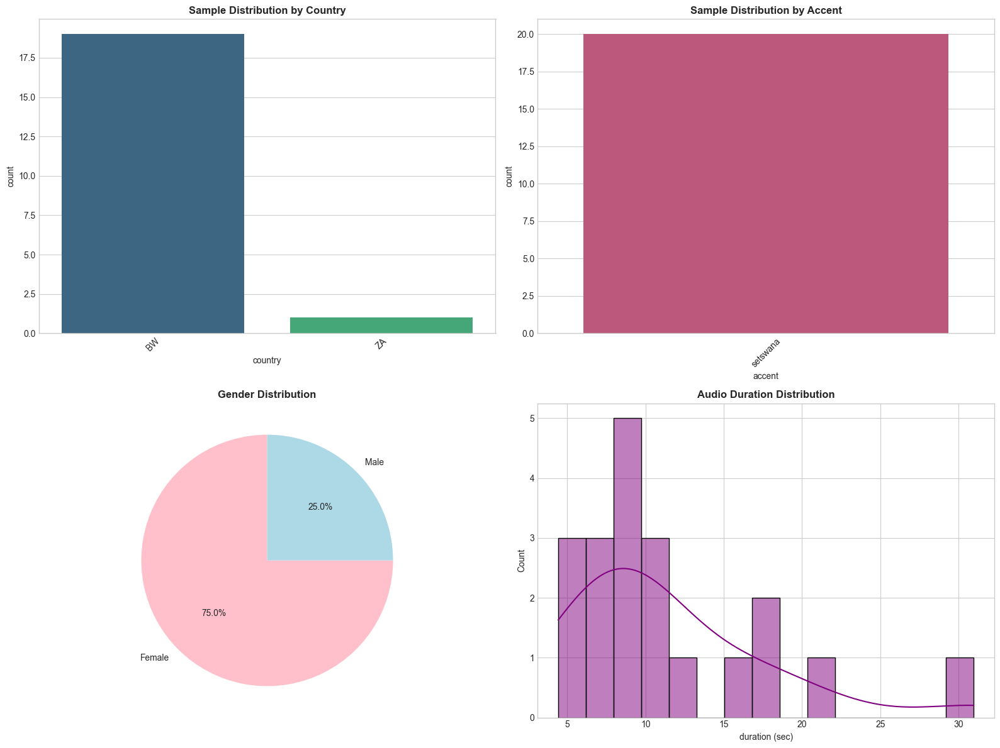

In [7]:
print("\nGenerating dataset visualizations...")
plt.style.use('seaborn-v0_8-whitegrid')
fig, axes = plt.subplots(2, 2, figsize=(16, 12))

sns.countplot(ax=axes[0, 0], x='country', data=df, palette='viridis')
axes[0, 0].set_title('Sample Distribution by Country', fontweight='bold')
axes[0, 0].tick_params(axis='x', rotation=45)

sns.countplot(ax=axes[0, 1], x='accent', data=df, palette='plasma')
axes[0, 1].set_title('Sample Distribution by Accent', fontweight='bold')
axes[0, 1].tick_params(axis='x', rotation=45)

gender_counts = df['gender'].value_counts()
axes[1, 0].pie(gender_counts, labels=gender_counts.index, autopct='%1.1f%%', startangle=90, colors=['pink', 'lightblue', 'gray'])
axes[1, 0].set_title('Gender Distribution', fontweight='bold')

sns.histplot(ax=axes[1, 1], data=df,x='duration (sec)', bins=15, kde=True, color='purple')
axes[1, 1].set_title('Audio Duration Distribution', fontweight='bold')

plt.tight_layout()
plt.show()

In [8]:
device = "cuda" if torch.cuda.is_available() else "cpu"
print(f"Using device: {device}")

model_name = "openai/whisper-small"
print(f"Loading Whisper model: {model_name}")
try:
    processor = WhisperProcessor.from_pretrained(model_name)
    model = WhisperForConditionalGeneration.from_pretrained(model_name)
    model.to(device)
    print(f"✅ Model successfully loaded on {device}!")
except Exception as e:
    print(f"❌ Error loading model: {e}")

Using device: cpu
Loading Whisper model: openai/whisper-small
✅ Model successfully loaded on cpu!


In [9]:
def transcribe_audio(audio_array, sampling_rate):
    try:
        if sampling_rate != 16000:
            audio_array = librosa.resample(y=audio_array, orig_sr=sampling_rate, target_sr=16000)

        input_features = processor(audio_array, sampling_rate=16000, return_tensors="pt").input_features.to(device)
        
        with torch.no_grad():
            predicted_ids = model.generate(input_features)
        
        transcription = processor.batch_decode(predicted_ids, skip_special_tokens=True)[0]
        return transcription.strip()
    except Exception as e:
        print(f"An error occurred during transcription: {e}")
        return "TRANSCRIPTION_FAILED"

print(f"Starting transcription of {len(df)} audio samples...")
transcription_results = []
for idx, row in df.iterrows():
    print(f"Transcribing sample {idx+1}/{len(df)}...")
    transcription = transcribe_audio(row['audio_array'], row['sampling_rate'])
    reference = row['transcript']
    
    transcription_results.append({
        'sample_id': row['sample_id'],
        'country': row['country'],
        'accent': row['accent'],
        'reference': reference,
        'transcription': transcription,
        'wer': wer(reference, transcription),
        'cer': cer(reference, transcription)
    })

results_df = pd.DataFrame(transcription_results)
print("✅ Transcription completed!")

Starting transcription of 20 audio samples...
Transcribing sample 1/20...


Using custom `forced_decoder_ids` from the (generation) config. This is deprecated in favor of the `task` and `language` flags/config options.
Transcription using a multilingual Whisper will default to language detection followed by transcription instead of translation to English. This might be a breaking change for your use case. If you want to instead always translate your audio to English, make sure to pass `language='en'`. See https://github.com/huggingface/transformers/pull/28687 for more details.
The attention mask is not set and cannot be inferred from input because pad token is same as eos token. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.


Transcribing sample 2/20...
Transcribing sample 3/20...
Transcribing sample 4/20...
Transcribing sample 5/20...
Transcribing sample 6/20...
Transcribing sample 7/20...
Transcribing sample 8/20...
Transcribing sample 9/20...
Transcribing sample 10/20...
Transcribing sample 11/20...
Transcribing sample 12/20...
Transcribing sample 13/20...
Transcribing sample 14/20...
Transcribing sample 15/20...
Transcribing sample 16/20...
Transcribing sample 17/20...
Transcribing sample 18/20...
Transcribing sample 19/20...
Transcribing sample 20/20...
✅ Transcription completed!


In [10]:
print("\n" + "="*50)
print("TRANSCRIPTION PERFORMANCE ANALYSIS")
print("="*50)

print(f"Overall Word Error Rate (WER): {results_df['wer'].mean():.4f}")
print(f"Overall Character Error Rate (CER): {results_df['cer'].mean():.4f}")

print("\n--- Performance by Country ---")
country_performance = results_df.groupby('country').agg(mean_wer=('wer', 'mean'), count=('wer', 'count')).round(4)
print(country_performance)

print("\n--- Performance by Accent ---")
accent_performance = results_df.groupby('accent').agg(mean_wer=('wer', 'mean'), count=('wer', 'count')).round(4)
print(accent_performance)


TRANSCRIPTION PERFORMANCE ANALYSIS
Overall Word Error Rate (WER): 1.0810
Overall Character Error Rate (CER): 0.4698

--- Performance by Country ---
         mean_wer  count
country                 
BW         1.1342     19
ZA         0.0714      1

--- Performance by Accent ---
          mean_wer  count
accent                   
setswana     1.081     20



Generating transcription performance visualizations...


C:\Users\Lunatic\AppData\Local\Temp\ipykernel_1900\2222508281.py:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(ax=axes[0], x='country', y='wer', data=results_df, palette='viridis', errorbar=None)
C:\Users\Lunatic\AppData\Local\Temp\ipykernel_1900\2222508281.py:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(ax=axes[1], x='accent', y='wer', data=results_df, palette='plasma', errorbar=None)


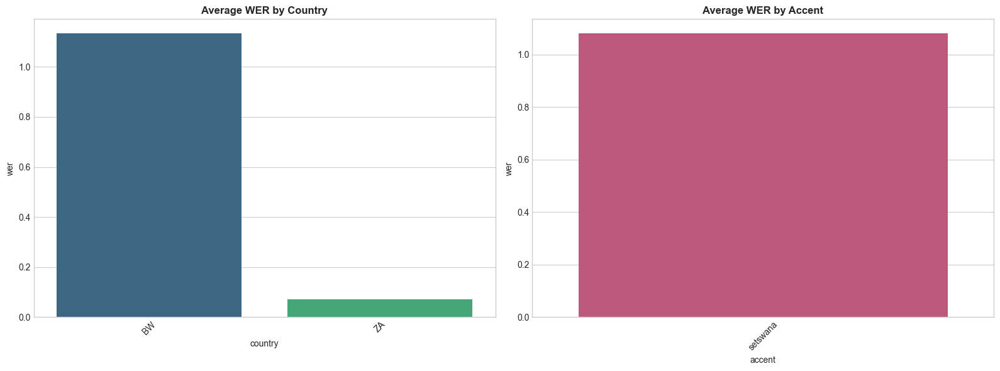

In [11]:
print("\nGenerating transcription performance visualizations...")
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

sns.barplot(ax=axes[0], x='country', y='wer', data=results_df, palette='viridis', errorbar=None)
axes[0].set_title('Average WER by Country', fontweight='bold')
axes[0].tick_params(axis='x', rotation=45)

sns.barplot(ax=axes[1], x='accent', y='wer', data=results_df, palette='plasma', errorbar=None)
axes[1].set_title('Average WER by Accent', fontweight='bold')
axes[1].tick_params(axis='x', rotation=45)

plt.tight_layout()
plt.show()



In [12]:
# ### **Cell 10: Show Sample Transcriptions**
# This cell prints a side-by-side comparison of the original (reference) text and the model's transcribed text.
# ```python
print("\n" + "="*50)
print("SAMPLE TRANSCRIPTIONS COMPARISON")
print("="*50)

for i in range(min(5, len(results_df))):
    sample = results_df.iloc[i]
    print(f"\n--- Sample {i+1} ({sample['country']}, {sample['accent']}) ---")
    print(f"WER: {sample['wer']:.4f}, CER: {sample['cer']:.4f}")
    print(f"REFERENCE:     {sample['reference']}")
    print(f"TRANSCRIPTION: {sample['transcription']}")
    print("-" * 70)


SAMPLE TRANSCRIPTIONS COMPARISON



--- Sample 1 (BW, setswana) ---
WER: 0.7727, CER: 0.4658
REFERENCE:     Similarly, an ACEI or a sartan is preferred over other antihypertensive drugs in diabetic patients where they slow the progression of nephropathy.
TRANSCRIPTION: in the life, and ACEI or a death sentence is said over other anti-hypercensors like an diabetic patient where they slow the progression of the miscarriage of the whole body.
----------------------------------------------------------------------

--- Sample 2 (BW, setswana) ---
WER: 0.5000, CER: 0.2471
REFERENCE:     These causes are discussed below with regard to different levels of blood vessels: 1.
TRANSCRIPTION: These courses are discussed below with a regard to different levels of blood vessels, colon 1, flu stop.
----------------------------------------------------------------------

--- Sample 3 (BW, setswana) ---
WER: 0.8333, CER: 0.5000
REFERENCE:     The moisture penetrates the sterile cloth, or paper, and carries organisms by capillary action to

In [13]:
print("\n" + "="*50)
print("TEXT PROCESSING AND CLEANING")
print("="*50)

stop_words = set(stopwords.words('english'))

def clean_text(text):
    text = text.lower()
    text = re.sub(r'[^\w\s]', '', text)
    tokens = word_tokenize(text)
    cleaned_tokens = [word for word in tokens if word not in stop_words and len(word) > 2]
    return " ".join(cleaned_tokens)

results_df['cleaned_transcription'] = results_df['transcription'].apply(clean_text)

print("--- Text Cleaning Examples ---")
for i in range(min(3, len(results_df))):
    print(f"\nOriginal:  {results_df.iloc[i]['transcription']}")
    print(f"Cleaned:   {results_df.iloc[i]['cleaned_transcription']}")


TEXT PROCESSING AND CLEANING
--- Text Cleaning Examples ---

Original:  in the life, and ACEI or a death sentence is said over other anti-hypercensors like an diabetic patient where they slow the progression of the miscarriage of the whole body.
Cleaned:   life acei death sentence said antihypercensors like diabetic patient slow progression miscarriage whole body

Original:  These courses are discussed below with a regard to different levels of blood vessels, colon 1, flu stop.
Cleaned:   courses discussed regard different levels blood vessels colon flu stop

Original:  Western Penetration of Stadile Cops of Paper and Creative Organizations by Teplati asking to continue their elders.
Cleaned:   western penetration stadile cops paper creative organizations teplati asking continue elders


In [14]:
print("\n" + "="*50)
print("SENTIMENT ANALYSIS")
print("="*50)

analyzer = SentimentIntensityAnalyzer()

def analyze_sentiment(text):
    blob = TextBlob(text)
    vader = analyzer.polarity_scores(text)
    return {
        'textblob_polarity': blob.sentiment.polarity,
        'vader_compound': vader['compound']
    }

sentiment_df = results_df['transcription'].apply(analyze_sentiment).apply(pd.Series)
results_df = pd.concat([results_df, sentiment_df], axis=1)

print("✅ Sentiment analysis completed!")
print("\n--- Sentiment Analysis Results (First 5 Samples) ---")
print(results_df[['transcription', 'textblob_polarity', 'vader_compound']].head())


SENTIMENT ANALYSIS
✅ Sentiment analysis completed!

--- Sentiment Analysis Results (First 5 Samples) ---
                                       transcription  textblob_polarity  \
0  in the life, and ACEI or a death sentence is s...           -0.07500   
1  These courses are discussed below with a regar...            0.00000   
2  Western Penetration of Stadile Cops of Paper a...            0.25000   
3  Various sites may be used for subcutaneous inj...            0.00000   
4  The major causes are as follows. Column 1. Sys...            0.20625   

   vader_compound  
0         -0.2732  
1         -0.5859  
2          0.4404  
3          0.0000  
4          0.4588  



Generating sentiment analysis visualizations...


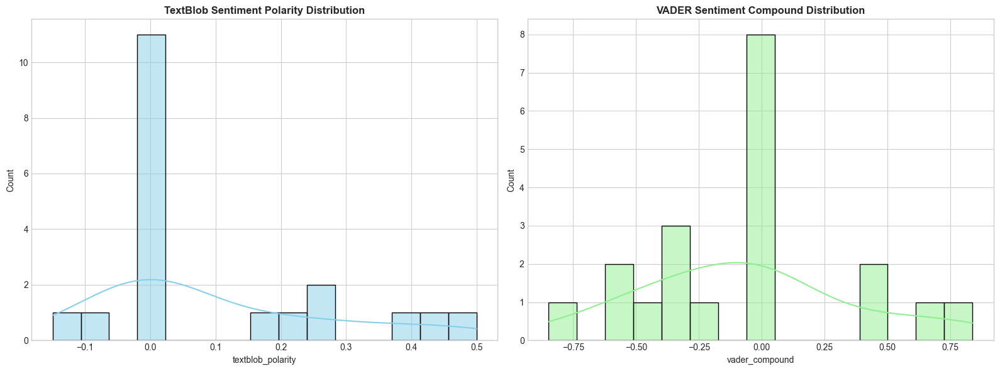

In [15]:
print("\nGenerating sentiment analysis visualizations...")
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

sns.histplot(ax=axes[0], data=results_df, x='textblob_polarity', bins=15, kde=True, color='skyblue')
axes[0].set_title('TextBlob Sentiment Polarity Distribution', fontweight='bold')

sns.histplot(ax=axes[1], data=results_df, x='vader_compound', bins=15, kde=True, color='lightgreen')
axes[1].set_title('VADER Sentiment Compound Distribution', fontweight='bold')

plt.tight_layout()
plt.show()

In [16]:
print("\n" + "="*50)
print("KEYWORD EXTRACTION AND TF-IDF ANALYSIS")
print("="*50)

vectorizer = TfidfVectorizer(max_features=20, stop_words='english')
tfidf_matrix = vectorizer.fit_transform(results_df['cleaned_transcription'])
feature_names = vectorizer.get_feature_names_out()

tfidf_scores = np.array(tfidf_matrix.mean(axis=0)).flatten()
important_terms = pd.DataFrame(zip(feature_names, tfidf_scores), columns=['term', 'tfidf_score'])
important_terms = important_terms.sort_values(by='tfidf_score', ascending=False)

print("\n--- Top 20 Most Important Terms (TF-IDF) ---")
print(important_terms.head(20))


KEYWORD EXTRACTION AND TF-IDF ANALYSIS

--- Top 20 Most Important Terms (TF-IDF) ---
          term  tfidf_score
16        stop     0.133326
11     patient     0.092883
2         city     0.080077
1         area     0.063534
7         life     0.060463
4      council     0.057716
14      really     0.050000
9   medication     0.048941
5      disease     0.046995
0     anterior     0.046545
17       upper     0.046191
18    vascular     0.045774
19       world     0.043460
15  relatively     0.037554
6    integrity     0.035355
10       money     0.035355
13    problems     0.026555
12   privately     0.026555
8         line     0.023670
3        comma     0.023670



Generating word cloud...


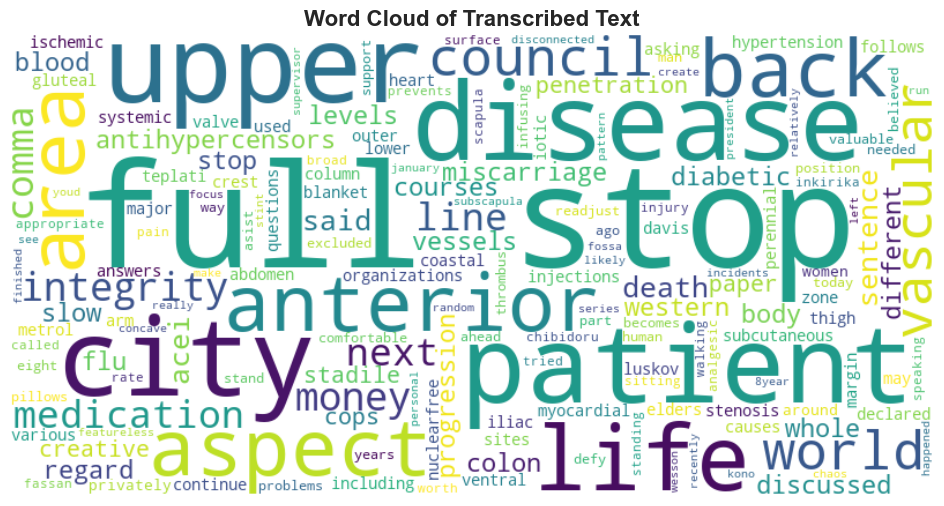

In [17]:
print("\nGenerating word cloud...")

transcription_corpus = " ".join(results_df['cleaned_transcription'].tolist())

wordcloud = WordCloud(
    width=800,
    height=400,
    background_color='white',
    colormap='viridis'
).generate(transcription_corpus)

plt.figure(figsize=(12, 6))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title('Word Cloud of Transcribed Text', fontsize=16, fontweight='bold')
plt.show()

In [18]:
print("\n" + "="*50)
print("INTERPRETATION & REFLECTION")
print("="*50)

avg_vader_score = results_df['vader_compound'].mean()
if avg_vader_score >= 0.05:
    dominant_sentiment = "Positive"
elif avg_vader_score <= -0.05:
    dominant_sentiment = "Negative"
else:
    dominant_sentiment = "Neutral"

print(f"Dominant Sentiment Patterns: The average VADER score is {avg_vader_score:.3f}, indicating an overall '{dominant_sentiment}' sentiment.")

print("\nKey Topics (from TF-IDF):")
print(f"The most significant keywords identified were: {', '.join(important_terms['term'].head(5).tolist())}.")

print("\nTranscription Quality and ASR Errors:")
print(f"The average Word Error Rate (WER) was {results_df['wer'].mean():.3f}. Performance varied by accent, highlighting ASR challenges.")

print("\nChallenges and Suggestions for Improvement:")
print("1. Accent Diversity: Fine-tuning the model on accent-specific data could reduce WER.")
print("2. Code-Switching: The dataset may contain mixed languages, which can confuse ASR models.")
print("3. Domain-Specific Jargon: Customizing the model's vocabulary can help with specialized terms.")


INTERPRETATION & REFLECTION
Dominant Sentiment Patterns: The average VADER score is -0.062, indicating an overall 'Negative' sentiment.

Key Topics (from TF-IDF):
The most significant keywords identified were: stop, patient, city, area, life.

Transcription Quality and ASR Errors:
The average Word Error Rate (WER) was 1.081. Performance varied by accent, highlighting ASR challenges.

Challenges and Suggestions for Improvement:
1. Accent Diversity: Fine-tuning the model on accent-specific data could reduce WER.
2. Code-Switching: The dataset may contain mixed languages, which can confuse ASR models.
3. Domain-Specific Jargon: Customizing the model's vocabulary can help with specialized terms.


In [19]:
results_df.to_csv('afrispeech_analysis_results.csv', index=False)
print("\n✅ Full results saved to 'afrispeech_analysis_results.csv'")

with open('afrispeech_summary_report.txt', 'w') as f:
    f.write("AFRISPEECH-200 ANALYSIS SUMMARY REPORT\n")
    f.write("="*50 + "\n\n")
    f.write(f"Total Samples Analyzed: {len(results_df)}\n")
    f.write(f"Overall WER: {results_df['wer'].mean():.4f}\n")
    f.write(f"Average Sentiment (VADER): {results_df['vader_compound'].mean():.3f}\n")
    f.write(f"Top 5 Keywords: {', '.join(important_terms['term'].head(5).tolist())}\n")

print("✅ Summary report saved to 'afrispeech_summary_report.txt'")


✅ Full results saved to 'afrispeech_analysis_results.csv'
✅ Summary report saved to 'afrispeech_summary_report.txt'
